<div style="text-align: center;">
  <h1 style="color: #2E86C1;">Medical Image Classification</h1>

  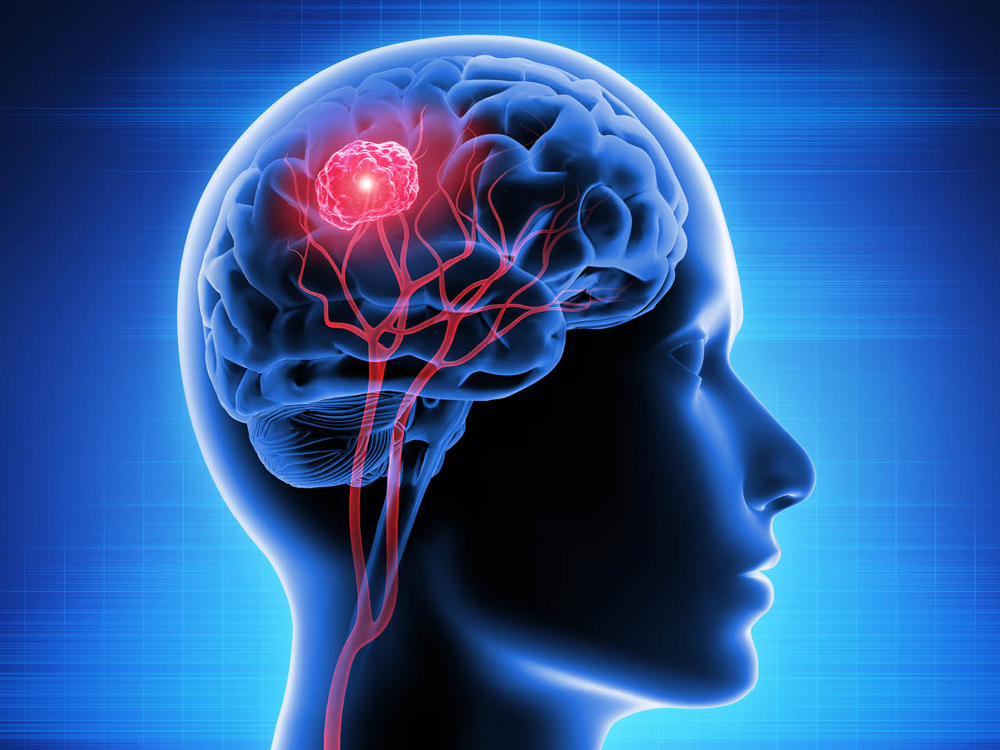
  <h3 style="color: #16A085;">A Deep Learning Approach to Classifying brain tumor</h3>
</div>


***Brain tumours***

A brain tumour is a growth of cells in the brain that multiplies in an abnormal, uncontrollable way.
Brain tumours are graded according to how fast they grow and how likely they are to grow back after treatment.

A deeper understanding of **brain tumor classification**  can help stakeholders in the healthcare industry :

- Identify brain tumors at an early stage 🧠
- Improve the accuracy of medical imaging analysis 🔬
- Support ongoing research in neuro-oncology 📚

**The primary stakeholders for this project include:**


   - radiologists 🏥

   -  neurologists 🧠

   -  medical researchers 🔬

   - healthcare institutions 🏩

***Brain Tumor Dataset***

A brain tumor detection dataset consists of medical images from MRI or CT scans, containing information about brain tumor presence, location, and characteristics. This dataset is essential for training computer vision algorithms to automate brain tumor identification, aiding in early diagnosis and treatment planning

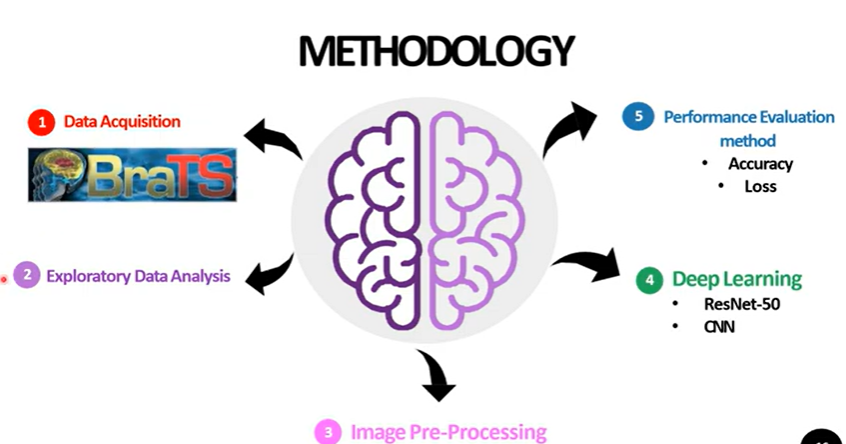

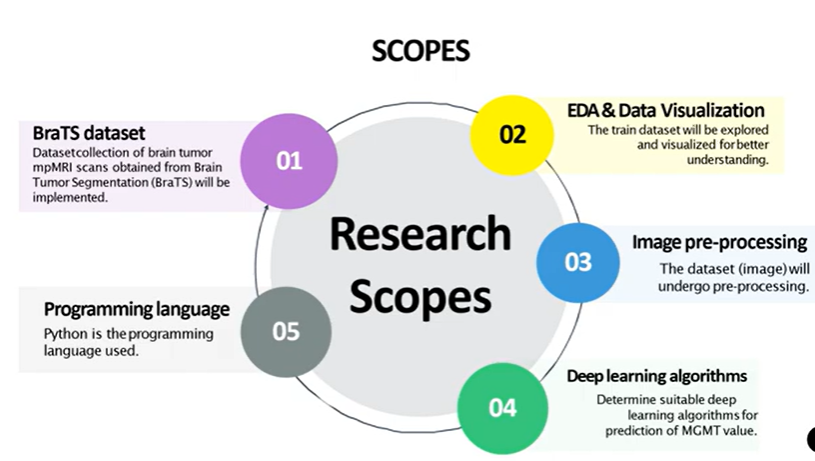

<div style="text-align: center;">
  <h2 style="color: #2980B9;">Step 1: Import All the Necessary Libraries</h2>
</div>

In [6]:
import cv2               as cv
import numpy             as np
import pandas            as pd
import seaborn           as sns
import matplotlib.pyplot as plt
import urllib
import random
import os
import glob
import shutil
#import visualkeras
from imutils               import paths
from sklearn.utils         import shuffle
from urllib.request        import urlopen
from sklearn.decomposition import PCA
from IPython.display       import Image
from tqdm                  import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import cv2
import numpy as np
from PIL import Image


import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models              import Sequential, load_model
from tensorflow.keras.preprocessing       import image
from tensorflow.keras.utils               import to_categorical, plot_model
from tensorflow.keras.callbacks           import ModelCheckpoint,EarlyStopping
from tensorflow.keras.layers              import Conv2D,Flatten,MaxPooling2D,Dense,Dropout,SpatialDropout2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator,img_to_array,load_img,array_to_img
from keras.layers                         import BatchNormalization, GlobalAveragePooling2D


import tensorflow as tf
from tensorflow.keras.applications import InceptionV3  # Pretrained InceptionV3 model
from tensorflow.keras.models import Model  # To define the model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D  # Custom layers
from tensorflow.keras.optimizers import Adam  # Optimizer for training
from IPython.display       import Image

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

# Vérifiez si le dossier existe
directory = '/content/drive/MyDrive/Brain Tumor Data Set'
if os.path.isdir(directory):
    print("Le dossier existe !")
else:
    print("Le dossier n'existe pas.")

Le dossier existe !


<div style="text-align: center;">
  <h2 style="color: #D35400;">Step 2: Import Data and Apply Data Preprocessing</h2>
</div>



In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Fonction de chargement des données
def load_data_from_directory(directory, target_size=(256, 256), labels_mapping=None):
    images = []
    labels = []

    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if not os.path.isdir(class_path):  # S'assurer que ce soit un répertoire
            continue
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = load_img(img_path, target_size=target_size)  # Charger l'image en redimensionnant
            img_array = img_to_array(img)
            images.append(img_array)
            labels.append(labels_mapping[class_name])

    return np.array(images), np.array(labels)

# Exemple d'utilisation
directory = '/content/drive/MyDrive/Brain Tumor Data Set'
x_data, y_data = load_data_from_directory(directory, target_size=(256, 256), labels_mapping={"Brain Tumor": 0, "Healthy": 1})


In [ ]:
# Check the shape of the data
print(f'Images shape: {x_data.shape}')
print(f'Labels shape: {y_data.shape}')

Images shape: (4600, 256, 256, 3)
Labels shape: (4600,)


In [ ]:
#Load Data
#import os
#from tensorflow.keras.preprocessing.image import load_img, img_to_array  # Import necessary functions
from sklearn.model_selection import train_test_split

x_data, y_data = load_data_from_directory(directory, target_size=(256, 256), labels_mapping={"Brain Tumor": 0, "Healthy": 1})
# TRAIN-VALIDATION-TEST SPLIT 70%,15%,15%
X_train, X_temp, y_train, y_temp = train_test_split(x_data, y_data, test_size=0.3, random_state=42) # 70% train, 30% temp
X_val, X_test, y_val, y_test     = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42) # 15% validaton, 15% test

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(3220, 256, 256, 3)
(690, 256, 256, 3)
(690, 256, 256, 3)


**`RGB to Grayscale Conversion`**

This method simply takes the mean of the three color channels. 🚀.


The equation to convert an RGB image to grayscale using the average method is:

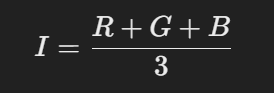


In [ ]:
# RGB to GRAY SCALE
X_train  = np.mean(X_train, axis=-1, keepdims=True)
X_val    = np.mean(X_val,   axis=-1, keepdims=True)
X_test   = np.mean(X_test,  axis=-1, keepdims=True)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(3220, 256, 256, 1)
(690, 256, 256, 1)
(690, 256, 256, 1)


# **Why Data Augmentation?**

*   It artificially increases the size and diversity of the dataset.
*  Helps the model generalize better and avoid overfitting



**Rescaling:** Normalizes pixel values to [0,1] by dividing by 255.

**Zoom, Shifts:** Introduces slight variations (zoom, width, and height shifts) to make the model more robust.

**Fill Mode:** Fills empty pixels after transformations with black (cval=0).

In [ ]:
#Data augmentation is only for train set.
train_datagen = ImageDataGenerator(rescale           =1.0/255,   # Normalization
                                   zoom_range        =0.2,       # Random zoom
                                   width_shift_range =0.2,       # Random shift
                                   height_shift_range=0.2,       # Random shift
                                   fill_mode         ='constant',# Fill empty pixel with constant
                                   cval              =0)         # Fill with black

#No augmentation for test set.
test_datagen  = ImageDataGenerator(rescale = 1.0/255)

# Creating Data Generators

data generators to efficiently feed images into a deep learning model in batches.

Batch Size 32: If you have limited GPU or CPU memory, a smaller batch size like 32 may be a better choice, as it requires less memory for each forward and backward pass.


In [ ]:
train_generator = train_datagen.flow(X_train,
                                     y_train,
                                     batch_size=32,
                                     shuffle=True)
val_generator   = test_datagen.flow (X_val,
                                     y_val,
                                     batch_size=32,
                                     shuffle=False)
test_generator  = test_datagen.flow (X_test,
                                     y_test,
                                     batch_size=32,
                                     shuffle=False)

In [ ]:
print(len(y_train))
print(len(y_val))
print(len(y_test))

3220
690
690


In [ ]:
labels_brain = {"Brain Tumor":0,
                "Healthy"    :1}

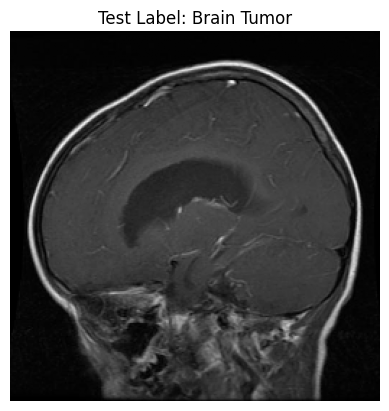

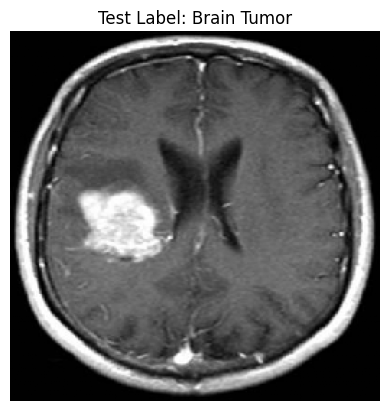

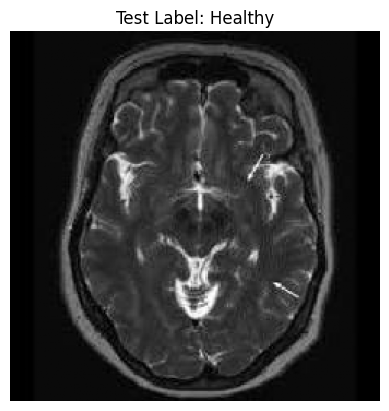

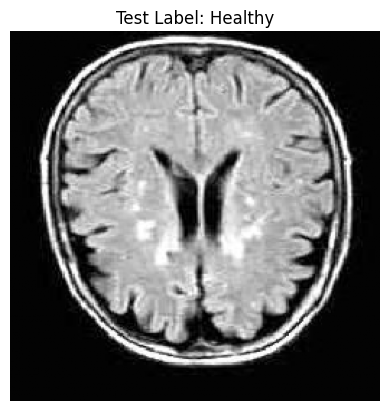

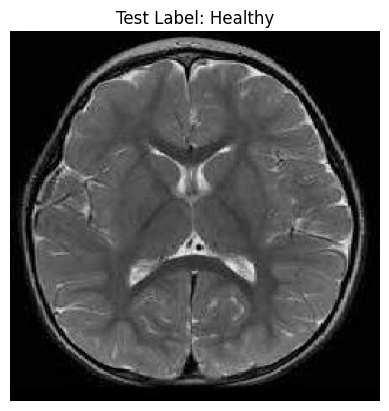

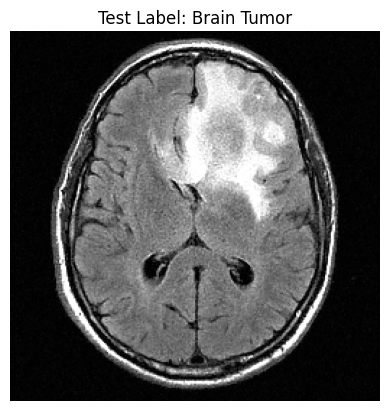

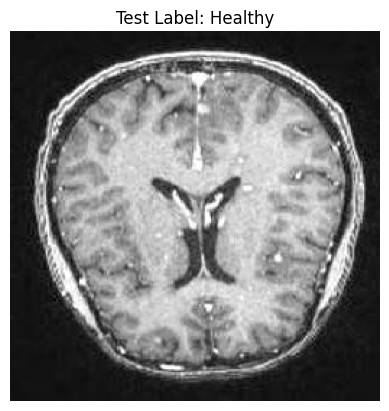

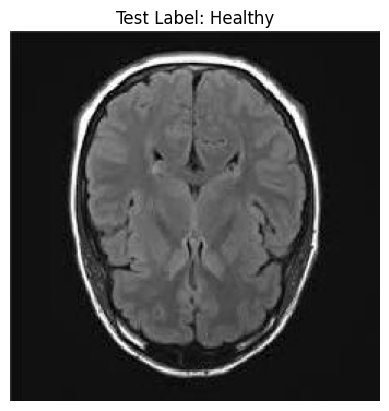

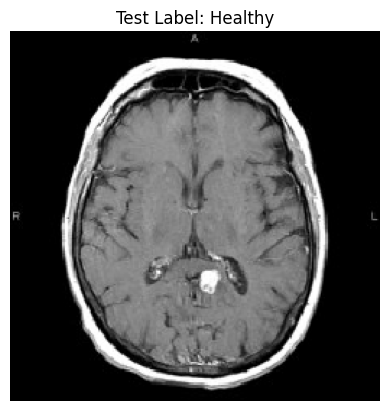

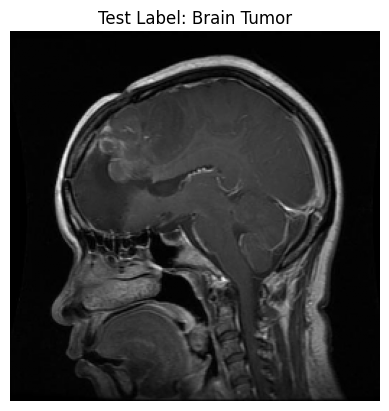

In [ ]:
for i in range(590,600):
    plt.imshow(X_test[i, :, :, 0], cmap='gray')
    class_index = y_test[i]
    label = [key for key, value in labels_brain.items() if value == class_index]
    plt.title(f"Test Label: {label[0]}")
    plt.axis("off")
    plt.show()


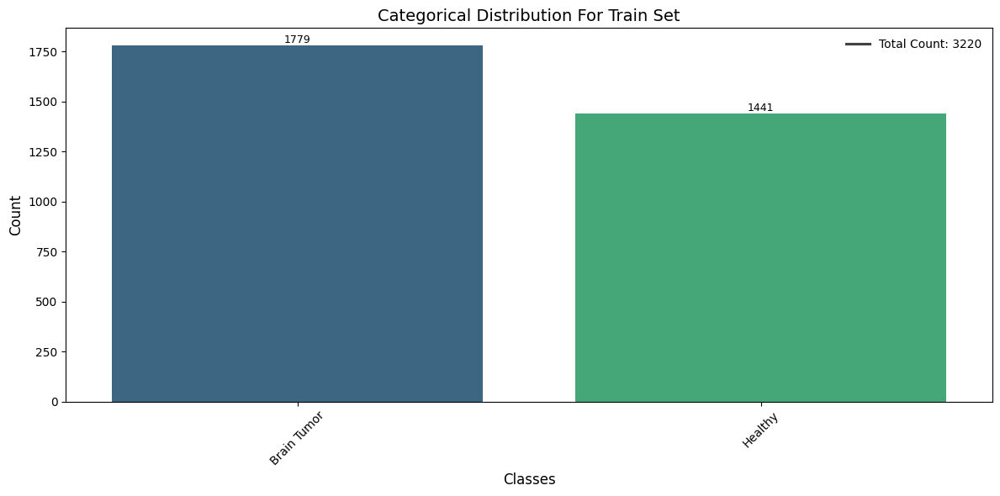

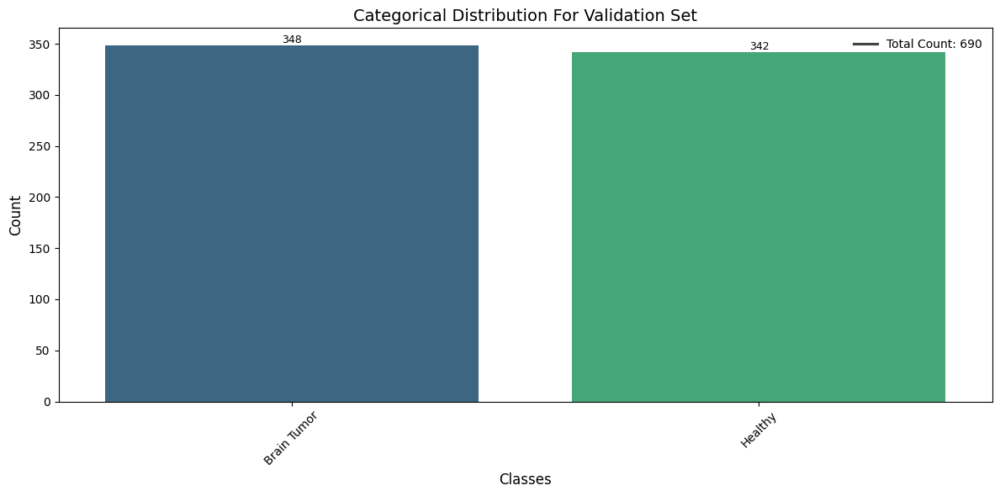

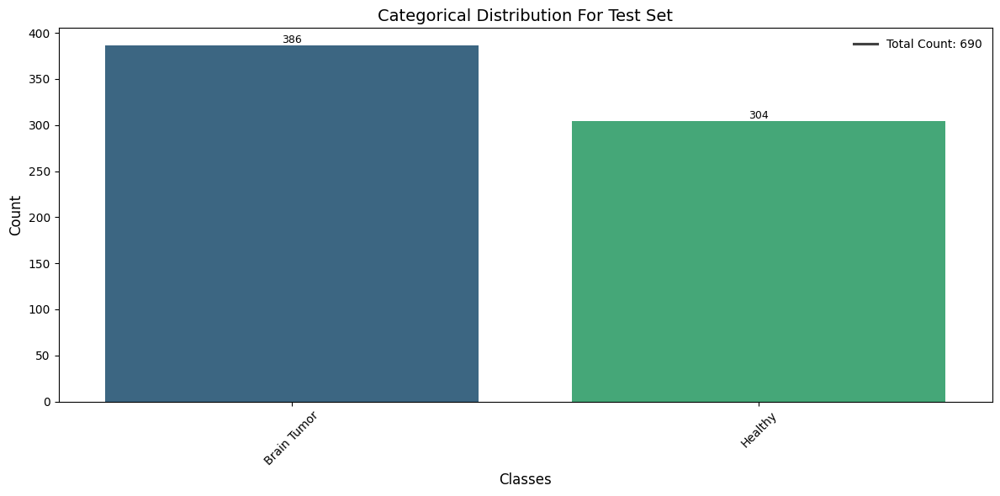

In [ ]:
def extract_labels(generator):
    labels = []
    for _ in range(len(generator)):
        _, label_batch = next(generator)
        labels.extend(label_batch)
    return labels

def plot_label_distribution(labels, title_name):
    reverse_labels        = {v: k for k, v in labels_brain.items()}
    title                 = "Categorical Distribution For " + title_name
    unique_labels, counts = np.unique(labels, return_counts=True)
    label_names_list      = [reverse_labels[label] for label in unique_labels]

    plt.figure(figsize=(12, 6))
    bars = sns.barplot(x=label_names_list, y=counts, palette="viridis")

    # Quantity
    for bar, count in zip(bars.patches, counts):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height(),
            f'{count}',
            ha='center',
            va='bottom',
            fontsize=9
        )

    plt.title(title, fontsize=14)
    plt.xlabel("Classes", fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45)

    # Legend
    total_count = np.sum(counts)
    plt.legend(
        [f"Total Count: {total_count}"],
        loc="upper right",
        frameon=False,
        fontsize=10
    )

    plt.tight_layout()
    plt.show()

# find labels
train_labels      = extract_labels(train_generator)
validation_labels = extract_labels(val_generator)
test_labels       = extract_labels(test_generator)

plot_label_distribution(train_labels, "Train Set")
plot_label_distribution(validation_labels, "Validation Set")
plot_label_distribution(test_labels, "Test Set")


In [ ]:
def plot_pie_chart(labels, title_name):
    reverse_labels = {v: k for k, v in labels_brain.items()}
    unique_labels, counts = np.unique(labels, return_counts=True)
    label_names_list = [reverse_labels[label] for label in unique_labels]

    plt.figure(figsize=(8, 8))
    plt.pie(counts, labels=label_names_list, autopct='%1.1f%%', colors=sns.color_palette("viridis", len(counts)))
    plt.title(f"Pie Chart for {title_name}", fontsize=14)
    plt.show()

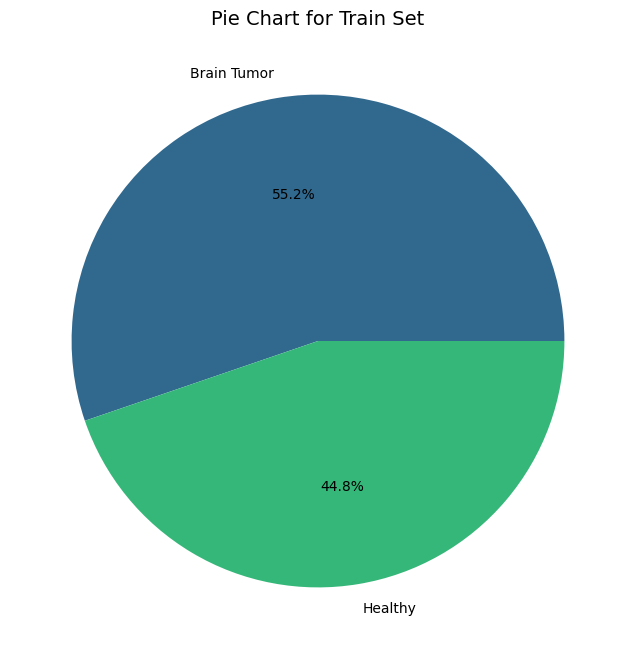

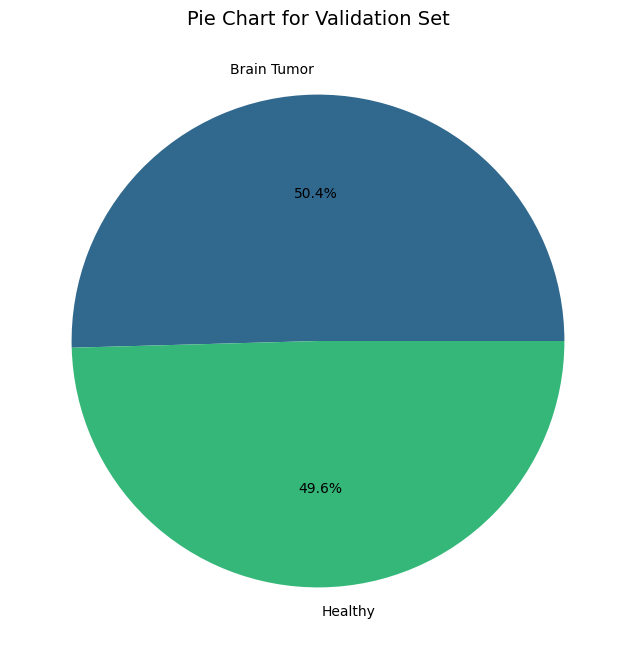

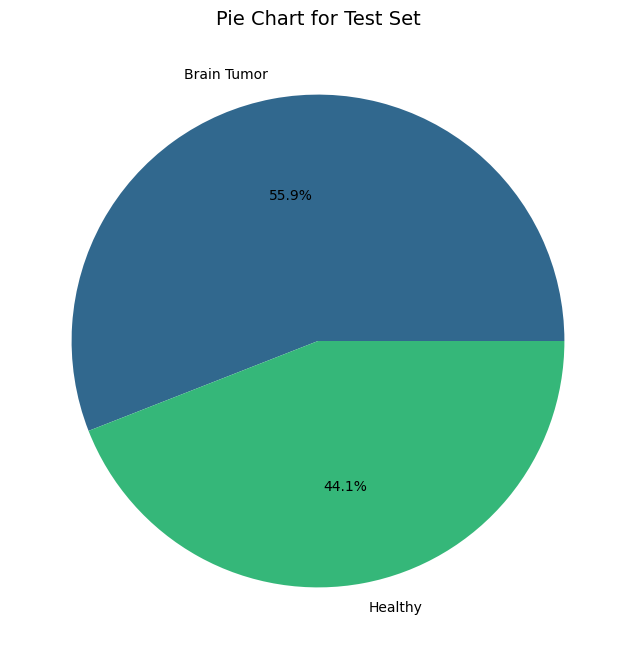

In [ ]:
plot_pie_chart(train_labels, "Train Set")
plot_pie_chart(validation_labels, "Validation Set")
plot_pie_chart(test_labels, "Test Set")

------------Train Set------------


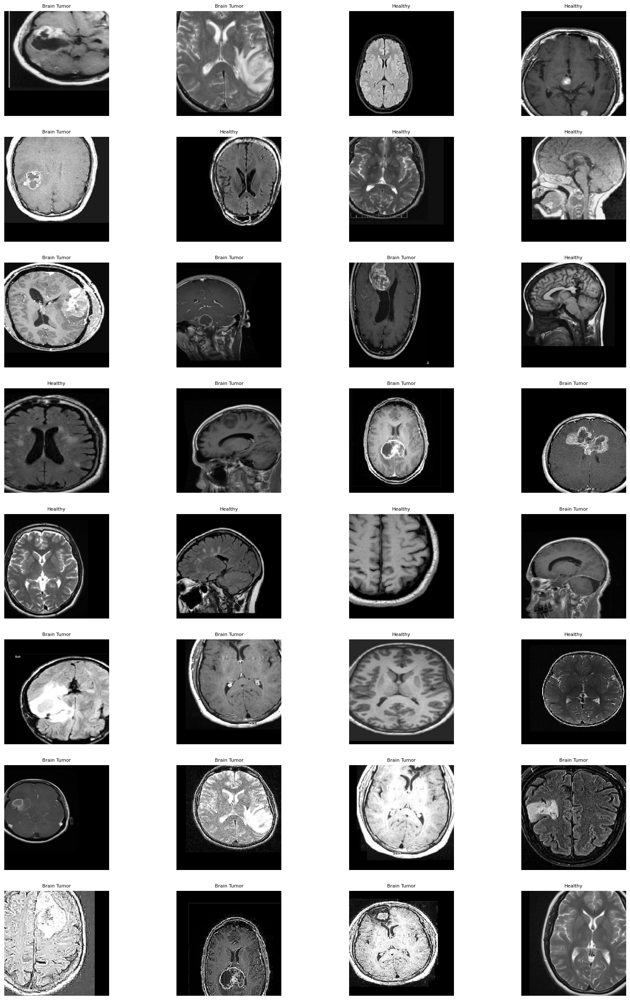

------------Validation Set------------


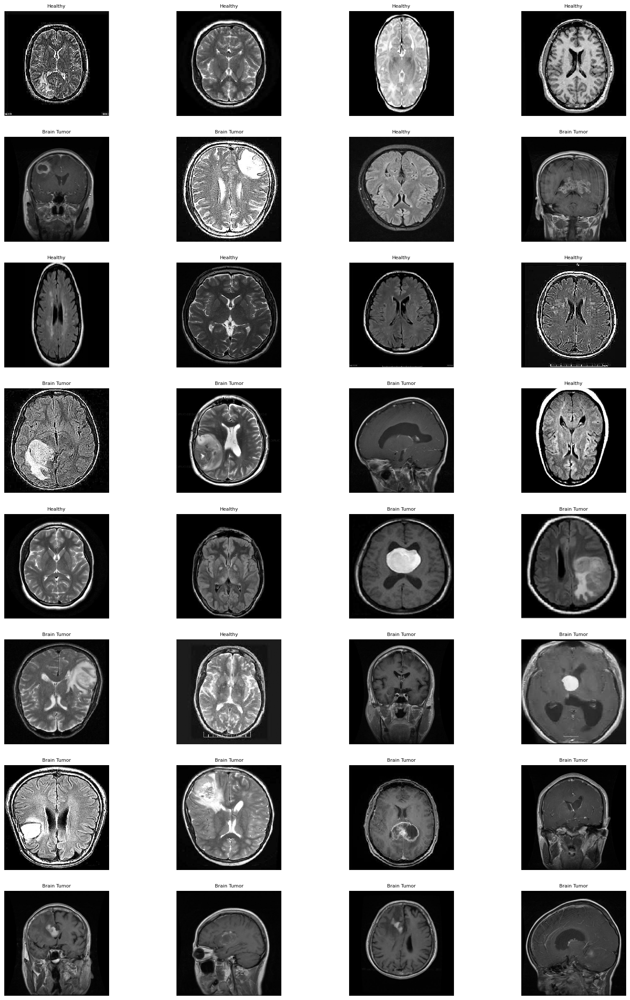

------------Test Set------------


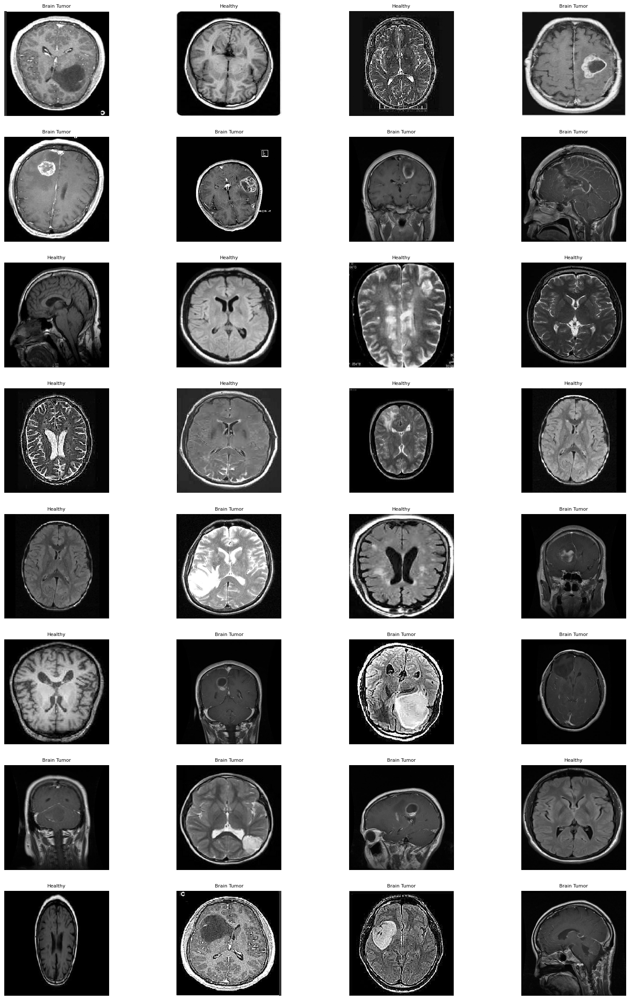

In [ ]:
def visualize_image(generator, num_images=100):
    reverse_labels = {v: k for k, v in labels_brain.items()}
    image_batch, label_batch = next(generator)

    plt.figure(figsize=(20, 30))
    for n in range(min(num_images, len(image_batch))):
        ax = plt.subplot(8, 4, n + 1)

        # rescale to 0-255
        img_rescaled = (image_batch[n] * 255).astype('uint8')

        if img_rescaled.shape[-1] == 1:  # 1 channel (grayscale)
            img_rescaled = img_rescaled.squeeze(-1)  # remove last dimension
        plt.imshow(img_rescaled, cmap='gray' if len(img_rescaled.shape) == 2 else None)
        # Show Labels
        class_index = label_batch[n]
        class_name = reverse_labels[class_index]
        plt.title(class_name, fontsize=8)
        plt.axis("off")
    plt.show()

print("------------Train Set------------")
visualize_image(train_generator, num_images=32)

print("------------Validation Set------------")
visualize_image(val_generator, num_images=32)

print("------------Test Set------------")
visualize_image(test_generator, num_images=32)


<div style="text-align: center;">
  <h2 style="color: #1F618D;">Step 3: The Modeling</h2>
</div>


**Convolution Layers:** Extract features using filters (3×3) with ReLU activation.
Batch Normalization: Normalizes activations for faster training.

**Max Pooling:** Reduces spatial size, keeping important features.

**Flatten:** Converts 2D feature maps into a 1D vector.
Dense Layers: Fully connected layers for decision-making.

**Dropout (0.5):**Prevents overfitting by randomly disabling neurons.

**Output Layer:** Uses sigmoid activation for binary classification.

In [ ]:
model = Sequential()

#Convolution Layer 1
model.add(Conv2D(filters     =32,
                 kernel_size =(3,3),
                 padding     ="same",
                 input_shape =(256,256,1),
                 activation  ="relu"))
#Batch Normalization Layer 1
model.add(BatchNormalization())
#Pooling Layer 1
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution Layer 2
model.add(Conv2D(filters     =64,
                 kernel_size =(3,3),
                 padding     ="same",
                 activation  ="relu"))
#Batch Normalization Layer 2
model.add(BatchNormalization())
#Pooling Layer 2
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution Layer 3
model.add(Conv2D(filters     =64,
                 kernel_size =(3,3),
                 padding     ="same",
                 activation  ="relu"))
#Batch Normalization Layer 3
model.add(BatchNormalization())
#Pooling Layer 3
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution Layer 4
model.add(Conv2D(filters     =128,
                 kernel_size =(3,3),
                 padding     ="same",
                 activation  ="relu"))
#Batch Normalization Layer 5
model.add(BatchNormalization())
#Pooling Layer 4
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Convolution Layer 5
model.add(Conv2D(filters     =128,
                 kernel_size =(3,3),
                 padding     ="same",
                 activation  ="relu"))
#Batch Normalization Layer 6
model.add(BatchNormalization())
#Pooling Layer 5
model.add(MaxPooling2D(pool_size=2,
                       strides=(2,2)))
#Flatten layer
model.add(Flatten())
#Dense Layer 1
model.add(Dense(units=512,
                activation="relu"))
#Batch Normalization Layer 7
model.add(BatchNormalization())
#Dense Layer 2
model.add(Dense(units=512,
                activation="relu"))
#Batch Normalization Layer 8
model.add(BatchNormalization())
#Dropout Layer 1
model.add(Dropout(rate=0.5))
#Dense Layer 3
model.add(Dense(units=1024,
                activation="relu"))
#Batch Normalization Layer 9
model.add(BatchNormalization())
#Output Layer
model.add(Dense(units=1,
                activation="sigmoid"))#binary classification

### This code compiles the CNN model by defining:

**Loss Function:**

"binary_crossentropy" → Used for binary classification (2 classes).

**Optimizer:**

"adam" → Adaptive optimizer for efficient training.
Evaluation Metrics:

Precision → Measures how many predicted positives are actually correct.

Recall → Measures how many actual positives were correctly predicted.

Accuracy → Measures overall correctness.

In [ ]:
model.compile(loss      = "binary_crossentropy",            #Use for 2 category.
              optimizer = "adam",                           #Better for multiple classes.
              metrics   = [tf.keras.metrics.Precision(),    #precission, recall, accuracy
                           tf.keras.metrics.Recall(),
                           "accuracy"])

**1. Early Stopping 🛑**

Stops training if val_loss does not improve for 15 epochs.
Prevents unnecessary training and saves time.

**2. ModelCheckpoint (Best Model) 💾**

Saves only the best model (lowest val_loss).
Ensures we keep the most optimized version of the model.

**3. ModelCheckpoint (Every 15 Epochs) 🔄**

Saves the model every 15 epochs, useful for recovery if training is interrupted.

In [ ]:
#To prevent Overfitting

callbacks = [EarlyStopping(monitor  = "val_loss", #Target Metric
                           patience = 15,         #Control every 15 epoch.
                           verbose  = 1,          #Show Information
                           mode     = "min"),     #Stop, if val_loss cannot decrease.
             #Save Best Model
             ModelCheckpoint(filepath           = "BestModel.keras",  #name
                             monitor            = "val_loss",         #Target Metric
                             mode               = "min",              #Decrase
                             save_best_only     = True,               #Save best model
                             save_weights_only  = False),             #Save all model/Save only weights
             #Save Every 15 epoch
             ModelCheckpoint(filepath='model_epoch_{epoch:02d}.keras', #name
                            save_freq=15 * train_generator.n // train_generator.batch_size)] #Save per 15 epoch

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 256, 256, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       4,194,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 5,270,849 (20.11 MB)

 Trainable params: 5,265,921 (20.09 MB)

 Non-trainable params: 4,928 (19.25 KB)

In [ ]:
type(train_generator)


keras.src.legacy.preprocessing.image.NumpyArrayIterator

In [ ]:
print("Train generator samples:", len(train_generator))
print("Validation generator samples:", len(val_generator))


Train generator samples: 101
Validation generator samples: 22


The training set has 102 batches

The validation set has 22 batches.

In [ ]:
# Training the Model
history = model.fit(train_generator,                       #Train Set
                    epochs=100,                           #Train for 100 Epoch
                    callbacks=callbacks,                   #Early Stopping and ModelCheckPoints
                    validation_data=val_generator,         #Validation Set
                    steps_per_epoch=len(train_generator),  #Steps per epoch
                    validation_steps=len(val_generator)    #Steps per validation epoch
)

Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 760s 7s/step - accuracy: 0.6002 - loss: 0.9580 - precision: 0.5567 - recall: 0.5747 - val_accuracy: 0.4957 - val_loss: 1.5499 - val_precision: 0.4957 - val_recall: 1.0000
Epoch 2/100


In [ ]:
# Read the CSV into a DataFrame
df = pd.read_csv('/content/epoch_data.csv')

# Find the index of the minimum validation loss
best_epoch_idx = df['val_loss'].idxmin()

# Get the best epoch and the corresponding validation loss
best_epoch = df.loc[best_epoch_idx, 'Epoch']
best_val_loss = df.loc[best_epoch_idx, 'val_loss']

print(f"Best epoch: {best_epoch}")
print(f"Validation loss of Best Epoch: {best_val_loss:.4f}")

Best epoch: 31
Validation loss of Best Epoch: 0.2327


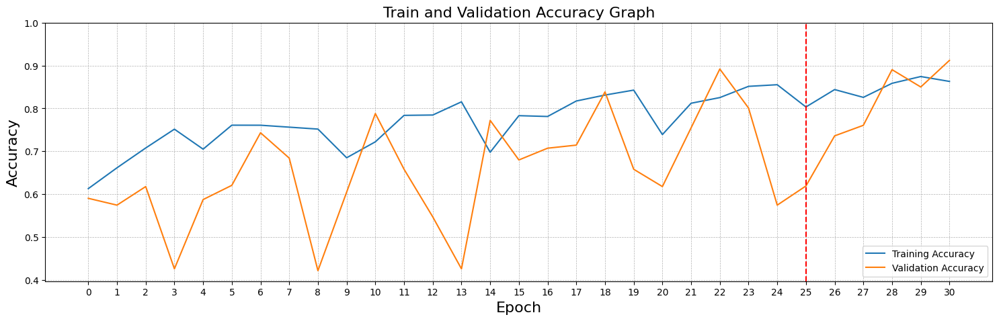

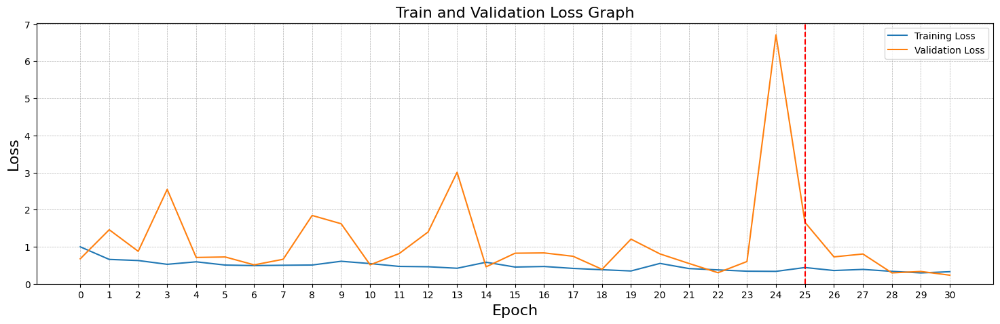

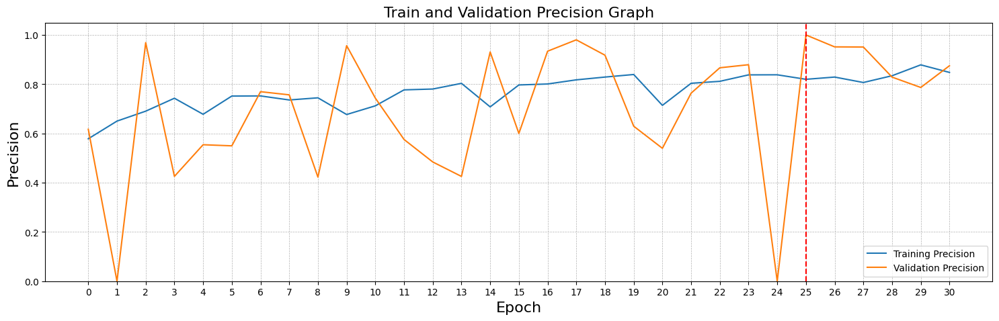

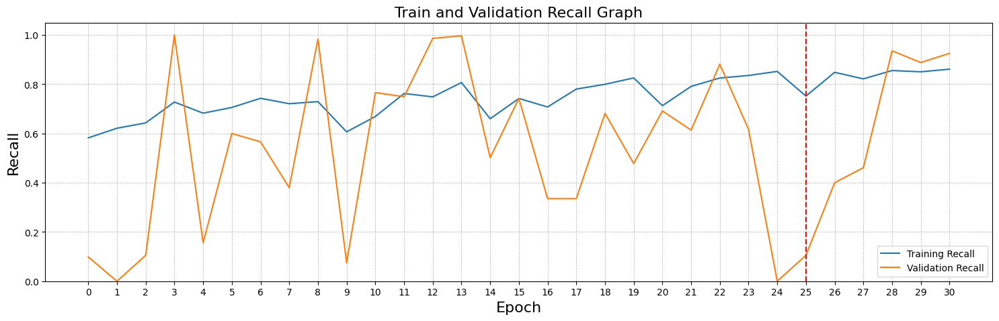

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/epoch_data.csv')

#------------------Epoch vs Accuracy------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,1)
plt.plot(df['accuracy'], label="Training Accuracy")
plt.plot(df['val_accuracy'], label="Validation Accuracy")
plt.legend(loc="lower right")
plt.axvline(x=25, color='r', linestyle='--', label='Epoch 25')
plt.xticks(range(0, len(df)))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Accuracy", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([min(plt.ylim()), 1])
plt.title("Train and Validation Accuracy Graph", fontsize=16)

#------------------Epoch vs Loss------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,2)
plt.plot(df['loss'], label="Training Loss")
plt.plot(df['val_loss'], label="Validation Loss")
plt.legend(loc="upper right")
plt.axvline(x=25, color='r', linestyle='--', label='Epoch 25')
plt.xticks(range(0, len(df)))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Loss", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0, max(plt.ylim())])
plt.title("Train and Validation Loss Graph", fontsize=16)

plt.show()

#------------------Epoch vs Precision------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,2)
plt.plot(df['precision'], label="Training Precision")
plt.plot(df['val_precision'], label="Validation Precision")
plt.legend(loc="lower right")
plt.axvline(x=25, color='r', linestyle='--', label='Epoch 25')
plt.xticks(range(0, len(df)))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Precision", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0, max(plt.ylim())])
plt.title("Train and Validation Precision Graph", fontsize=16)

plt.show()

#------------------Epoch vs Recall------------------
plt.figure(figsize=(40,5))
plt.subplot(1,2,2)
plt.plot(df['recall'], label="Training Recall")
plt.plot(df['val_recall'], label="Validation Recall")
plt.legend(loc="lower right")
plt.axvline(x=25, color='r', linestyle='--', label='Epoch 25')
plt.xticks(range(0, len(df)))
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Recall", fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.ylim([0, max(plt.ylim())])
plt.title("Train and Validation Recall Graph", fontsize=16)

plt.show()


**The model's accuracy is improving, and loss is decreasing ==> the model is learning well.**

**Validation Performance:**
The model has some ups and downs in terms of validation metrics, but it shows improvement, with validation accuracy stabilizing and improving by the end.

In [ ]:
print(df)

    Epoch  accuracy    loss  precision  recall  val_accuracy  val_loss  \
0       1    0.6128  0.9973     0.5784  0.5822        0.5902    0.6744   
1       2    0.6614  0.6577     0.6502  0.6212        0.5743    1.4579   
2       3    0.7076  0.6279     0.6905  0.6429        0.6176    0.8759   
3       4    0.7515  0.5258     0.7430  0.7276        0.4257    2.5449   
4       5    0.7049  0.5933     0.6779  0.6824        0.5873    0.7103   
5       6    0.7608  0.5057     0.7519  0.7056        0.6205    0.7236   
6       7    0.7607  0.4911     0.7524  0.7429        0.7431    0.5106   
7       8    0.7562  0.5003     0.7360  0.7208        0.6840    0.6614   
8       9    0.7517  0.5069     0.7447  0.7293        0.4214    1.8423   
9      10    0.6848  0.6076     0.6769  0.6065        0.6046    1.6196   
10     11    0.7220  0.5458     0.7122  0.6689        0.7879    0.5122   
11     12    0.7837  0.4694     0.7770  0.7623        0.6580    0.8146   
12     13    0.7845  0.4603     0.7804

In [ ]:
best_epoch_data = df[df['Epoch'] == 31]

# Print the data for epoch 31
print(best_epoch_data)

    Epoch  accuracy    loss  precision  recall  val_accuracy  val_loss  \
30     31    0.8629  0.3267     0.8479  0.8611         0.912    0.2327   

    val_precision  val_recall  
30          0.875      0.9254  


Comparison with Test set

In [ ]:
# Load BestModel.keras:
#best_model = load_model('BestModel.keras')
best_model = load_model('/content/drive/MyDrive/Brain Tumor Data Set/BestModel.keras')

In [ ]:
from google.colab import files
files.download("BestModel.keras")



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download("/content/model_epoch_15.keras")
files.download("/content/model_epoch_30.keras")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Values of test test
test_loss, test_precision, test_recall, test_accuracy = best_model.evaluate(test_generator, batch_size=64)
print("\nTest Accuracy: %.6f%%" % (100.0*test_accuracy))
print("\nTest Loss: %.6f%%" % (100.0*test_loss))
print("\nTest Precision: %.6f%%" % (100.0*test_precision))
print("\nTest Recall: %.6f%%" % (100.0*test_recall))

22/22 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.9249 - loss: 0.1809 - precision: 0.8902 - recall: 0.9417

Test Accuracy: 92.207789%

Test Loss: 18.397081%

Test Precision: 88.958991%

Test Recall: 93.687707%


**The model performs very well on the test set, with high accuracy, precision, and recall.**



*   The precision and recall values indicate that the model strikes a good balance between detecting positive cases and minimizing false positives.

*   The loss is relatively low, suggesting the model is making accurate predictions.



Overall, these are excellent results and show the model is effective for the task.

In [ ]:
# Set the number of steps (batches) for prediction
steps = len(test_generator)

# Initialize empty lists to collect predictions and true labels
y_pred = []
y_true = []

# Use tqdm to show a progress bar during the prediction process
for batch in tqdm(range(steps), desc="Predicting", unit="batch"):
    # Get the next batch (inputs and labels) from the generator
    batch_inputs, batch_labels = next(test_generator)

    # Make predictions for the current batch
    batch_predictions = model.predict(batch_inputs)

    # If it's binary classification, round the predictions
    if batch_predictions.shape[1] == 1:  # Binary classification
        batch_predictions = np.round(batch_predictions).astype(int)
    else:  # Multi-class classification, use np.argmax
        batch_predictions = np.argmax(batch_predictions, axis=1)

    y_pred.extend(batch_predictions)  # Add the predictions for this batch to the list
    y_true.extend(batch_labels)  # Add the true labels for this batch to the list

# Convert the lists to numpy arrays
y_pred = np.array(y_pred)
y_true = np.array(y_true)

# Map the true labels to match the labels_brain dictionary
y_true_mapped = [1 if label == 1 else 0 for label in y_true]  # Map "Healthy" (1) to 1 and "Brain Tumor" (0) to 0

# Generate the classification report
report = classification_report(y_true_mapped, y_pred, target_names=['Brain Tumor', 'Healthy'])
print(report)


Predicting:   0%|          | 0/22 [00:00<?, ?batch/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Predicting:   5%|▍         | 1/22 [00:01<00:35,  1.68s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:   9%|▉         | 2/22 [00:03<00:30,  1.51s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  14%|█▎        | 3/22 [00:04<00:27,  1.43s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  18%|█▊        | 4/22 [00:05<00:25,  1.39s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  23%|██▎       | 5/22 [00:07<00:23,  1.37s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Predicting:  27%|██▋       | 6/22 [00:09<00:28,  1.79s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Predicting:  32%|███▏      | 7/22 [00:11<00:28,  1.90s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Predicting:  36%|███▋      | 8/22 [00:14<00:29,  2.14s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  41%|████      | 9/22 [00:15<00:24,  1.89s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  45%|████▌     | 10/22 [00:17<00:20,  1.71s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  50%|█████     | 11/22 [00:18<00:17,  1.58s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  55%|█████▍    | 12/22 [00:19<00:14,  1.50s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  59%|█████▉    | 13/22 [00:20<00:12,  1.44s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  64%|██████▎   | 14/22 [00:22<00:11,  1.40s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Predicting:  68%|██████▊   | 15/22 [00:24<00:12,  1.77s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Predicting:  73%|███████▎  | 16/22 [00:27<00:12,  2.03s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  77%|███████▋  | 17/22 [00:28<00:09,  1.81s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  82%|████████▏ | 18/22 [00:30<00:06,  1.67s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  86%|████████▋ | 19/22 [00:31<00:04,  1.57s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  91%|█████████ | 20/22 [00:32<00:02,  1.50s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting:  95%|█████████▌| 21/22 [00:34<00:01,  1.47s/batch]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Predicting: 100%|██████████| 22/22 [00:35<00:00,  1.62s/batch]

              precision    recall  f1-score   support

 Brain Tumor       0.95      0.93      0.94       392
     Healthy       0.91      0.93      0.92       301

    accuracy                           0.93       693
   macro avg       0.93      0.93      0.93       693
weighted avg       0.93      0.93      0.93       693



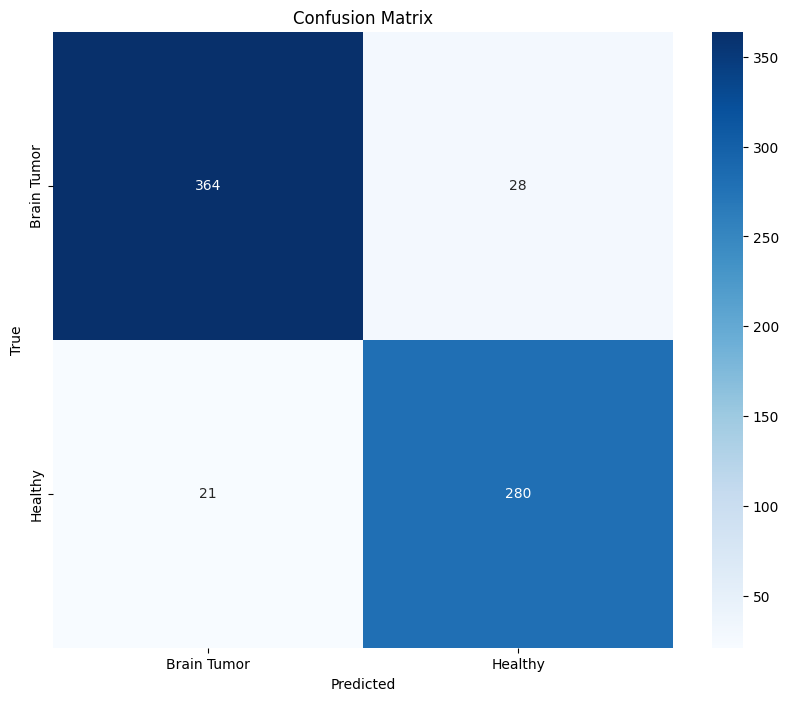

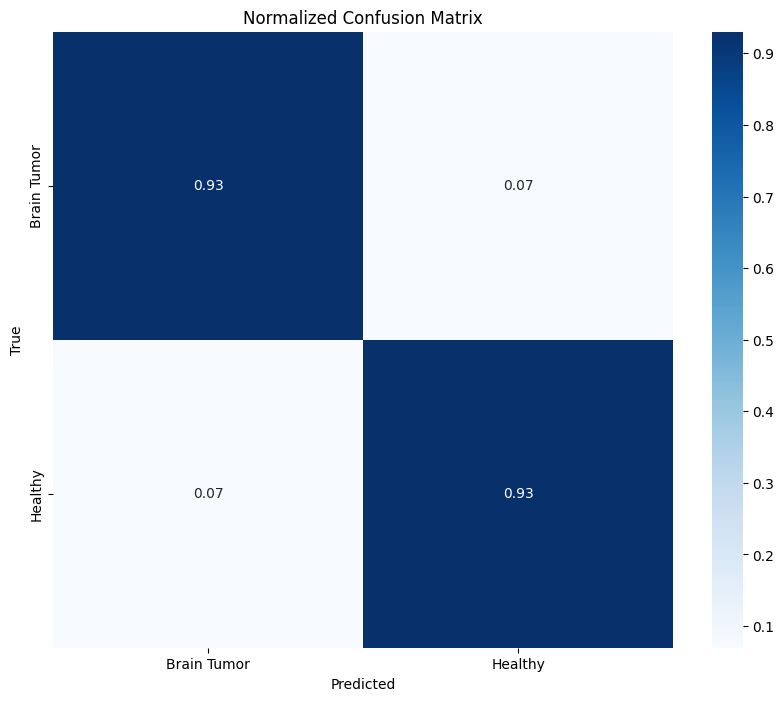

In [ ]:
# Confision Matrix

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Turn confusion matrix into a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    conf_matrix,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=list(labels_brain.keys()),
    yticklabels=list(labels_brain.keys())
)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Normalized Confusion Matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(10, 8))
sns.heatmap(
    conf_matrix_normalized,
    annot=True,
    fmt='.2f',
    cmap='Blues',
    xticklabels=list(labels_brain.keys()),
    yticklabels=list(labels_brain.keys())
)
plt.title('Normalized Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

The function **model_testing** is designed to test a trained model on a subset of samples from a test generator, display the predictions, and visualize the results

The output will be a grid of images (24 images) , with the true labels, predicted labels, and confidence scores shown in the titles for each image.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


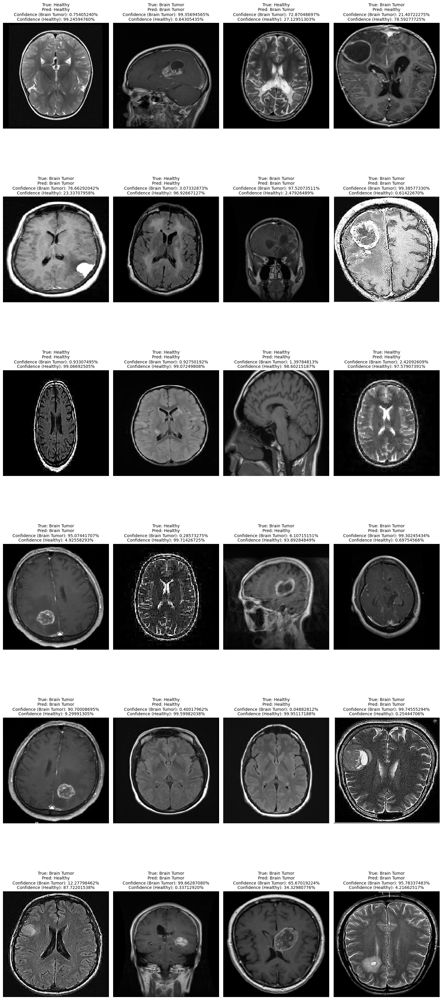

array([[0.9924595 ],
       [0.00643054],
       [0.27129513],
       [0.7859278 ],
       [0.2333708 ],
       [0.9692667 ],
       [0.02479265],
       [0.00614227],
       [0.99066925],
       [0.990725  ],
       [0.9860215 ],
       [0.97579074],
       [0.04925583],
       [0.9971427 ],
       [0.9389285 ],
       [0.00697546],
       [0.09299913],
       [0.9959982 ],
       [0.9995117 ],
       [0.00254447],
       [0.87722015],
       [0.00337129],
       [0.34329808],
       [0.04216625]], dtype=float32)

In [ ]:
def model_testing(test_generator, n, label_dict, model, threshold=0.5):
    """
    Test the model with `n` samples from the test generator and display predictions.

    Args:
        test_generator: A data generator yielding batches of data and labels.
        n: Number of samples to test.
        label_dict: Dictionary mapping class names to numeric labels.
        model: Trained model to use for predictions.
        threshold: Threshold for classifying probabilities.

    Returns:
        predictions: Model predictions for the selected samples.
    """
    all_features = []
    all_labels = []

    # Gather all samples from the test generator
    for i, (data, labels) in enumerate(test_generator):
        all_features.append(data)
        all_labels.append(labels)
        if i + 1 == len(test_generator):
            break

    # Convert to numpy arrays
    all_features = np.vstack(all_features)
    all_labels = np.hstack(all_labels)

    # Randomly sample `n` indices
    if n > len(all_features):
        n = len(all_features)
    sampled_indices = random.sample(range(len(all_features)), n)

    sampled_features = all_features[sampled_indices]
    sampled_labels = all_labels[sampled_indices]

    # Map numeric labels to human-readable names
    true_labels = [list(label_dict.keys())[list(label_dict.values()).index(label)] for label in sampled_labels]

    # Get predictions from the model
    predictions = model.predict(sampled_features)

    # Set up the plot
    cols = 4
    rows = (n + cols - 1) // cols
    plt.figure(figsize=(15, rows * 6))

    for i in range(n):
        true_label = true_labels[i]
        predicted_probability = predictions[i][0]  # Single probability output

        # Calculate confidence values
        confidence_healthy = predicted_probability * 100      # Class 1: Healthy
        confidence_brain_tumor = (1 - predicted_probability) * 100  # Class 0: Brain Tumor

        # Determine predicted class and label
        predicted_class = 0 if confidence_brain_tumor > confidence_healthy else 1
        predicted_label = list(label_dict.keys())[list(label_dict.values()).index(predicted_class)]

        ax = plt.subplot(rows, cols, i + 1)
        if sampled_features[i].shape[-1] == 1:
            ax.imshow(sampled_features[i][:, :, 0], cmap='gray')
        else:
            ax.imshow(sampled_features[i])

        ax.axis('off')
        ax.set_title(
            f"True: {true_label}\nPred: {predicted_label}\n"
            f"Confidence (Brain Tumor): {confidence_brain_tumor:.8f}%\n"
            f"Confidence (Healthy): {confidence_healthy:.8f}%",
            fontsize=10,
            color='black'
        )

    plt.tight_layout()
    plt.show()

    return predictions

model_testing(test_generator, 24, labels_brain, best_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step
Prediction: [[0.09160424]]


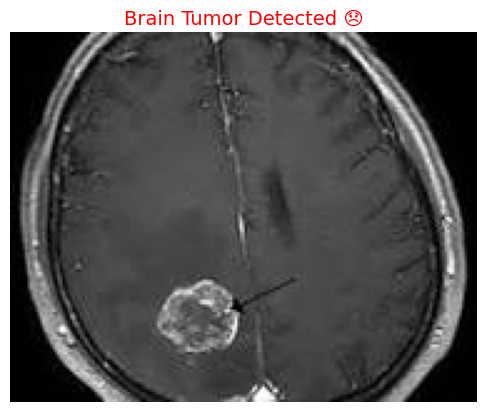

In [ ]:



def preprocess_image(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale (1 channel)
    img = cv2.resize(img, (256, 256))  # Resize to match model input
    img = img.astype('float32') / 255.0  # Normalize pixel values to [0, 1]
    img = np.expand_dims(img, axis=-1)  # Add channel dimension (256, 256, 1)
    img = np.expand_dims(img, axis=0)  # Add batch dimension (1, 256, 256, 1)
    return img

# Example usage
img_path = "/content/download.jpg"  # Change this to the actual path of your image
input_image = preprocess_image(img_path)

# Predict
prediction = best_model.predict(input_image)
print("Prediction:", prediction)

#  binary classification (1 = No Tumor, 0 = Tumor)

if prediction[0][0] < 0.5:
    result = "Brain Tumor Detected 😞"
else:
    result = "No Brain Tumor 🎉"

# Display the image with prediction
plt.imshow(Image.open(img_path))
plt.axis("off")
plt.title(result, fontsize=14, color='red' if "Detected" in result else 'green')
plt.show()

# Pretrained model


# EfficientNet Model

In [4]:
# ✅ Function to Load Data from Directory
def load_data_from_directory(directory, target_size=(256, 256), labels_mapping=None):
    """
    Loads images from the given directory and assigns labels.
    Args:
        directory (str): Path to dataset directory.
        target_size (tuple): Target image size (default = (256, 256)).
        labels_mapping (dict): Mapping of class names to integer labels.

    Returns:
        images (numpy array): Preprocessed images.
        labels (numpy array): Corresponding labels.
    """
    images, labels = [], []

    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if not os.path.isdir(class_path):  # Skip files, only process directories
            continue
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = load_img(img_path, target_size=target_size)  # Load image and resize
            img_array = img_to_array(img)  # Convert to numpy array
            images.append(img_array)
            labels.append(labels_mapping[class_name])

    return np.array(images), np.array(labels)

# ✅ Step 1: Load Images and Labels
directory = '/content/drive/MyDrive/Deep learning/Brain Tumor Data Set/'
labels_mapping = {"Brain Tumor": 0, "Healthy": 1}

X_data, y_data = load_data_from_directory(directory, target_size=(256, 256), labels_mapping=labels_mapping)

# Normalize images (convert pixels to range [0,1])
X_data = X_data / 255.0

# ✅ Step 2: Split Dataset (Train 70%, Validation 15%, Test 15%)
X_train, X_temp, y_train, y_temp = train_test_split(X_data, y_data, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Convert labels to one-hot encoding
y_train = to_categorical(y_train, num_classes=2)
y_val = to_categorical(y_val, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# ✅ Step 3: Data Augmentation
train_datagen = ImageDataGenerator(
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='constant',
    cval=0
)

# No augmentation for validation and test sets (only normalization)
test_datagen = ImageDataGenerator()

# ✅ Step 4: Create Data Generators
train_generator = train_datagen.flow(X_train, y_train, batch_size=32, shuffle=True)
val_generator   = test_datagen.flow(X_val, y_val, batch_size=32, shuffle=False)
test_generator  = test_datagen.flow(X_test, y_test, batch_size=32, shuffle=False)

# ✅ Print dataset shape for verification
print("Training Set Shape:", X_train.shape)
print("Validation Set Shape:", X_val.shape)
print("Test Set Shape:", X_test.shape)


Training Set Shape: (3220, 256, 256, 3)
Validation Set Shape: (690, 256, 256, 3)
Test Set Shape: (690, 256, 256, 3)


✅ Importing the model


In [7]:
# Load InceptionV3 without the top classification layer
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Freeze base model layers (only train new layers first)
base_model.trainable = False

# Add custom classification layers
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Convert feature maps into a single vector
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout to reduce overfitting
output_layer = Dense(2, activation='softmax')(x)  # Output layer (2 classes)

# Create the final model
model = Model(inputs=base_model.input, outputs=output_layer)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [8]:
history = model.fit(train_generator,
                    validation_data=val_generator,
                    epochs=10)


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'brain_tumor_inceptionv3.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

✅ Evaluate & Test



In [ ]:
 test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2f}")


44/44 ━━━━━━━━━━━━━━━━━━━━ 214s 5s/step - accuracy: 0.7744 - loss: 0.4665
Test Loss: 0.4661458432674408
Test Accuracy: 0.7734487652778625


## Training vs validation accuracy plot

In [ ]:
import matplotlib.pyplot as plt

# Plot training vs validation accuracy
plt.figure(figsize=(8, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='s')

# Formatting the graph
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Train Accuracy vs Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


44/44 ━━━━━━━━━━━━━━━━━━━━ 180s 4s/step
              precision    recall  f1-score   support

           0       0.56      0.67      0.61       392
           1       0.43      0.32      0.37       301

    accuracy                           0.52       693
   macro avg       0.50      0.50      0.49       693
weighted avg       0.50      0.52      0.51       693

[[263 129]
 [204  97]]


## train loss vs validation loss plot

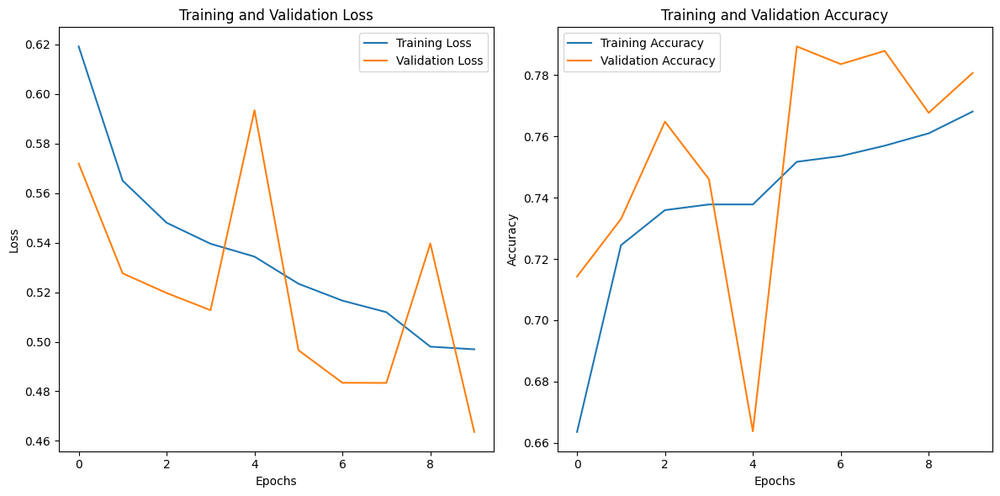

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='s')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train Loss vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()


## Testing out the model with imported pictures

In [ ]:
from PIL import Image
import numpy as np

def predict_image(image_path):
    # Load and preprocess image
    img = Image.open(image_path).convert("RGB")  # Convert grayscale to RGB
    img = img.resize((256, 256))  # Resize to match model input size
    img = np.array(img) / 255.0  # Normalize pixel values
    img = img.reshape(1, 256, 256, 3)  # Reshape for model input

    # Make prediction
    prediction = model.predict(img)
    class_idx = np.argmax(prediction)  # Get class with highest probability

    # Print the prediction result
    if class_idx == 0:
        print("Prediction: Brain Tumor Detected")
    else:
        print("Prediction: Healthy Brain")

# ✅ Example usage
predict_image("/content/drive/MyDrive/Deep learning/normalScan.jpg")


History saved to training_history.csv
